# Meta-Reinforcement Learning vs PPO: A Comparative Study

This notebook demonstrates the implementation of a meta-reinforcement learning (Meta-RL) algorithm and a Proximal Policy Optimization (PPO) model. We compare their performance on environments exhibiting 'regular' and 'chaotic' behavior.

In [40]:
!python3 -m pip install --upgrade pip
!pip install shimmy>=2.0

## 1. Introduction

Meta-RL seeks to enable policies that adapt quickly to varying tasks. PPO, on the other hand, optimizes policies for specific tasks using a robust gradient update mechanism. By comparing these methods, we gain insights into their strengths and weaknesses.

In [64]:
import numpy as np
import gymnasium as gym  # 注意这里改为 gymnasium

class RegularChaoticEnv(gym.Env):
    def __init__(self, chaotic=False):
        super(RegularChaoticEnv, self).__init__()
        self.chaotic = chaotic
        self.state = 0.0
        self.t = 0
        self.max_steps = 10000
        self.action_space = gym.spaces.Box(low=-1.0, high=1.0, shape=(1,))
        self.observation_space = gym.spaces.Box(low=-np.inf, high=np.inf, shape=(1,))

    def reset(self, *, seed=None, options=None):
        super().reset(seed=seed)
        self.state = 0.1 if not self.chaotic else 0.5
        self.t = 0
        return np.array([self.state], dtype=np.float32), {}

    def step(self, action):
        target_amplitude = 0.1  # 目标振幅
        amplitude_error = target_amplitude - abs(self.state)  # 振幅误差

        if self.chaotic:
            # Logistic map for chaotic behavior
            self.state = self.state * (3.9 - 3.9 * self.state)  # Logistic map for chaos
            action_adjustment = amplitude_error * 0.1  # 振幅误差的调整
            self.state += np.clip(action[0] * 0.01 + action_adjustment, -0.1, 0.1)  # 加入动作的影响和振幅调整
        else:
            # Regular behavior: sine wave
            self.state = np.sin(self.t / 10.0)  # Regular sinusoidal behavior
            self.state += action[0] * 0.1  # Action modulates the sine wave

        #reward = -amplitude_error ** 2  # 振幅误差的平方作为负奖励，鼓励减小振幅误差
        reward = -abs(self.state - target_amplitude)
        self.t += 1
        terminated = self.t >= self.max_steps
        truncated = False
        info = {}

        return np.array([self.state], dtype=np.float32), reward, terminated, truncated, info


# Example usage:
env = RegularChaoticEnv(chaotic=False)

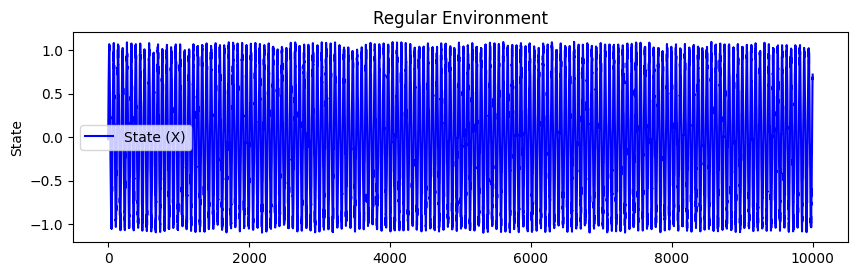

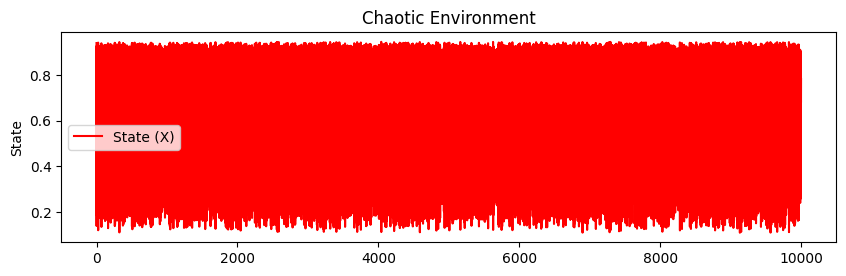

In [65]:
import matplotlib.pyplot as plt

# Function to generate states and actions
def generate_data(env, steps=10000):
    obs = env.reset()
    states = []
    actions = []
    for _ in range(steps):
        action = np.random.uniform(-1, 1, size=(1,))  # Random action for testing
        actions.append(action[0])
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # 合并 terminated 和 truncated
        states.append(obs[0])
        if done:
            break
    return np.array(states), np.array(actions)

# Generate data for both environments
env_regular = RegularChaoticEnv(chaotic=False)
regular_states, regular_actions = generate_data(env_regular)

env_chaotic = RegularChaoticEnv(chaotic=True)
chaotic_states, chaotic_actions = generate_data(env_chaotic)

# Plotting Regular Environment
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.plot(regular_states, label="State (X)", color="blue")
plt.title("Regular Environment")
plt.ylabel("State")
plt.legend()

# Plotting Chaotic Environment
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 2)
plt.plot(chaotic_states, label="State (X)", color="red")
plt.title("Chaotic Environment")
plt.ylabel("State")
plt.legend()





## 3. Meta-RL Implementation

We implement a simple meta-learning algorithm based on policy adaptation.

In [61]:
import torch
import torch.nn as nn
import torch.optim as optim

class MetaRLAgent:
    def __init__(self, obs_dim, act_dim, lr=0.001):
        self.model = nn.Sequential(
            nn.Linear(obs_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, act_dim)
        )
        self.optimizer = optim.Adam(self.model.parameters(), lr=lr)

    # def select_action(self, state):
    #     with torch.no_grad():
    #         return self.model(torch.tensor(state, dtype=torch.float32)).numpy()
    def select_action(self, state):
    # 确保 state 转换成 torch 张量并且形状正确
        state = torch.tensor(state, dtype=torch.float32).unsqueeze(0)  # Add batch dimension: [1, state_dim]
        
        with torch.no_grad():
            action = self.model(state)  # 使用元学习模型来选择动作
            action = action.squeeze(0)  # 去掉 batch 维度，转换回 [state_dim]
            
            # 确保动作被限制在 action_space 内
            action = np.clip(action.numpy(), -1.0, 1.0)

        return action  # 返回 numpy 数组


    def update(self, states, actions, rewards):
        # 将输入转换为 PyTorch 张量
        states = torch.tensor(states, dtype=torch.float32)
        actions = torch.tensor(actions, dtype=torch.float32)
        rewards = torch.tensor(rewards, dtype=torch.float32)

        # 模型预测的动作值
        predicted_actions = self.model(states)

        # 计算损失：最小化预测动作与真实动作之间的误差加上奖励的负值
        loss = torch.mean((predicted_actions - actions) ** 2 - rewards)

        # 反向传播和优化
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()


# Example training
meta_agent = MetaRLAgent(obs_dim=1, act_dim=1)

## 4. PPO Implementation

We use the PPO algorithm with the same environment.

In [62]:
from stable_baselines3 import PPO
from stable_baselines3.common.env_checker import check_env

# Create the environment (Regular or Chaotic)
env_regular = RegularChaoticEnv(chaotic=False)

# Check environment compatibility (optional, for debugging)
check_env(env_regular)

# PPO setup and training
ppo_agent = PPO("MlpPolicy", env_regular, verbose=1)
ppo_agent.learn(total_timesteps=10000)


Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 1e+03    |
|    ep_rew_mean     | -641     |
| time/              |          |
|    fps             | 236      |
|    iterations      | 1        |
|    time_elapsed    | 8        |
|    total_timesteps | 2048     |
---------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 1e+03        |
|    ep_rew_mean          | -643         |
| time/                   |              |
|    fps                  | 160          |
|    iterations           | 2            |
|    time_elapsed         | 25           |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.0021441951 |
|    clip_fraction        | 0.004        |
|    clip_range           | 0.2          |
|    en

## 5. Training and Comparison

In [63]:
# Training both agents on 'regular' and 'chaotic' environments
env_regular = RegularChaoticEnv(chaotic=False)
env_chaotic = RegularChaoticEnv(chaotic=True)

# Training Meta-RL agent on 'regular' environment
for episode in range(100):  # Example number of episodes
    state, _ = env_regular.reset()  # Reset environment
    states, actions, rewards = [], [], []
    for step in range(10000):  # Max steps per episode
        action = meta_agent.select_action(state)  # Select action
        obs, reward, terminated, truncated, info = env_regular.step(action)
        done = terminated or truncated  # Check if episode ends
        
        # Record data
        states.append(state)
        actions.append(action)
        rewards.append(reward)
        # Print state, action, and reward for debugging
        print(f"Step {step}: State = {state}, Action = {action}, Reward = {reward}")
        # Update state
        state = obs
        if done:
            break
    
    # Update Meta-RL agent
    meta_agent.update(states, actions, rewards)


# PPO Testing
ppo_obs, _ = env_regular.reset()
for _ in range(10000):
    action, _states = ppo_agent.predict(ppo_obs, deterministic=True)
    obs, reward, terminated, truncated, info = env_regular.step(action)
    done = terminated or truncated  # 合并 terminated 和 truncated
    if done:
        break

Step 0: State = [0.1], Action = [-0.16457376], Reward = -0.1164573758840561
Step 1: State = [-0.01645738], Action = [-0.16866845], Reward = -0.01703342824567368
Step 2: State = [0.08296657], Action = [-0.16495195], Reward = -0.08217413576389512
Step 3: State = [0.18217413], Action = [-0.16567191], Reward = -0.1789530151797493
Step 4: State = [0.27895302], Action = [-0.16715986], Reward = -0.2727023567720752
Step 5: State = [0.37270236], Action = [-0.17060614], Reward = -0.3623649249720009
Step 6: State = [0.4623649], Action = [-0.17469096], Reward = -0.4471733772112585
Step 7: State = [0.5471734], Action = [-0.17802751], Reward = -0.5264149361733905
Step 8: State = [0.62641495], Action = [-0.1811946], Reward = -0.5992366305552083
Step 9: State = [0.69923663], Action = [-0.18213873], Reward = -0.6651130370159608
Step 10: State = [0.76511306], Action = [-0.18343942], Reward = -0.723127042940545
Step 11: State = [0.82312703], Action = [-0.18544415], Reward = -0.7726629454219625
Step 12: S

## 6. Results Visualization

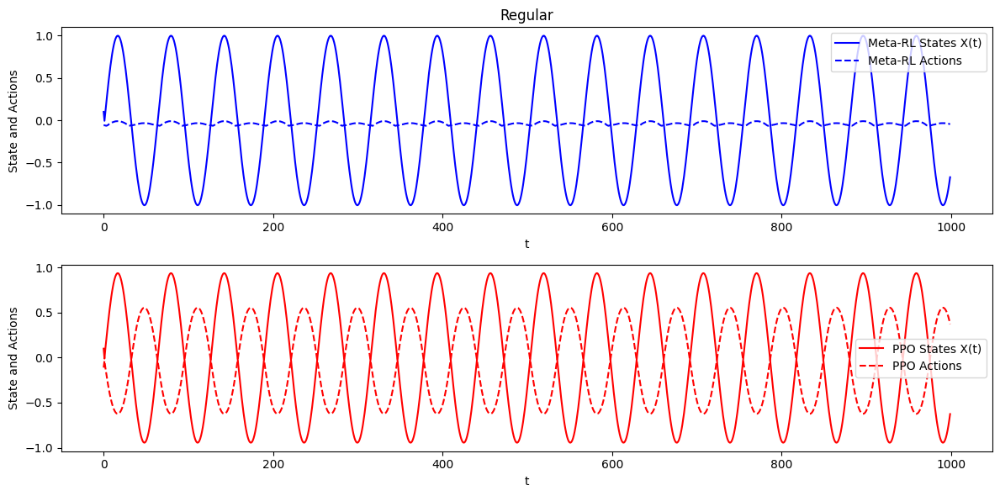

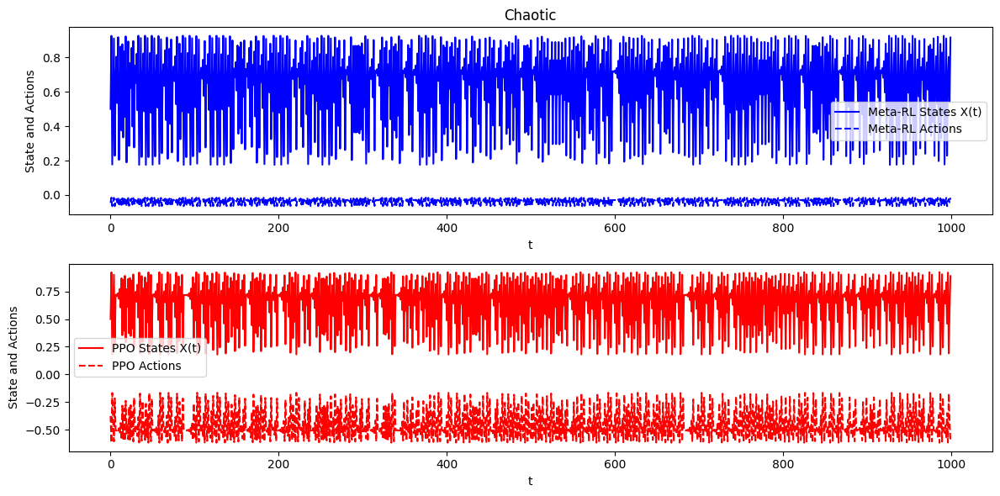

In [46]:
import matplotlib.pyplot as plt

# Compare Regular and Chaotic for both agents
for chaotic in [False, True]:
    env = RegularChaoticEnv(chaotic=chaotic)

    # Meta-RL
    obs, _= env.reset()
    meta_states = []
    meta_actions = []

    for _ in range(100000):
        action = meta_agent.select_action(obs)
        meta_states.append(obs[0])  # Storing the state
        meta_actions.append(action[0])  # Storing the action
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # Check if episode ends
        if done:
            break

    # PPO
    obs, _ = env.reset()
    ppo_states = []
    ppo_actions = []
    for _ in range(100000):
        action, _ = ppo_agent.predict(obs, deterministic=True)
        ppo_states.append(obs[0])  # Storing the state
        ppo_actions.append(action[0])  # Storing the action
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # Check if episode ends
        if done:
            break

    # Plotting
    plt.figure(figsize=(12, 6))

    # Plotting states and actions for Meta-RL
    plt.subplot(2, 1, 1)
    plt.plot(meta_states, label="Meta-RL States X(t)", color="blue")
    plt.plot(meta_actions, label="Meta-RL Actions", color="blue", linestyle="--")
    plt.title(f"Chaotic" if chaotic else "Regular")
    plt.xlabel("t")
    plt.ylabel("State and Actions")
    plt.legend()

    # Plotting states and actions for PPO
    plt.subplot(2, 1, 2)
    plt.plot(ppo_states, label="PPO States X(t)", color="red")
    plt.plot(ppo_actions, label="PPO Actions", color="red", linestyle="--")
    plt.xlabel("t")
    plt.ylabel("State and Actions")
    plt.legend()

    plt.tight_layout()
    plt.show()


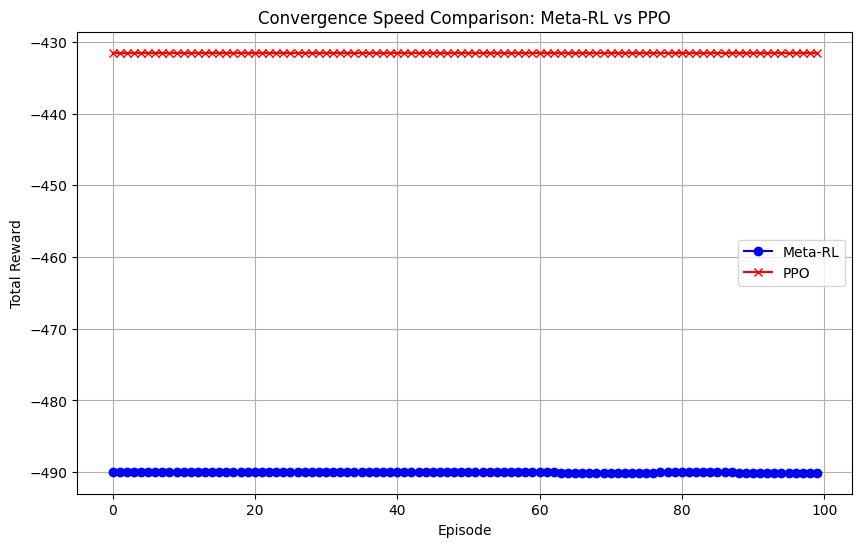

In [53]:
# Initialize environment
env_regular = RegularChaoticEnv(chaotic=False)  # Or True for chaotic environment

# Example training setup
meta_rewards = []
ppo_rewards = []

# Meta-RL Training Loop
for episode in range(100):  # Example number of episodes
    state, _ = env_regular.reset()  # Reset and ignore info
    total_reward = 0
    states, actions, rewards = [], [], []  # Track states, actions, and rewards
    for _ in range(1000):  # Max steps
        action = meta_agent.select_action(state)
        next_state, reward, terminated, truncated, info = env_regular.step(action)
        total_reward += reward  # Ensure reward is scalar
        states.append(state)   # Store state
        actions.append(action)  # Store action
        rewards.append(reward)  # Store scalar reward
        state = next_state
        if terminated or truncated:
            break
    meta_rewards.append(total_reward)
    meta_agent.update(states, actions, rewards)  # Update the Meta-RL agent



# PPO Training Loop
for episode in range(100):  # Example number of episodes
    state, _ = env_regular.reset()  # Reset and ignore info
    total_reward = 0
    for _ in range(1000):  # Max steps
        action, _states = ppo_agent.predict(state, deterministic=True)
        next_state, reward, terminated, truncated, info = env_regular.step(action)
        total_reward += reward
        state = next_state
        if terminated or truncated:
            break
    ppo_rewards.append(total_reward)


# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(meta_rewards, label="Meta-RL", color='blue', linestyle='-', marker='o')
plt.plot(ppo_rewards, label="PPO", color='red', linestyle='-', marker='x')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Convergence Speed Comparison: Meta-RL vs PPO")
plt.legend()
plt.grid(True)
plt.show()

